# Reaction-diffusion Assignment
## The Gray-Scott Model

##### Laurent Pétré & Ilan Renous

In this assignment, we are going to simulate the interaction of two generic chemical species reacting diffusing. We are going tu use a two dimension version of a model called the Gray-Scott model. Let's get started!

In [14]:
# We import the libraries we will need
import numpy as npy
import matplotlib.pyplot as plt
import matplotlib.cm as cm
%matplotlib inline
from JSAnimation.IPython_display import display_animation
import matplotlib.animation as anim

## The Gray-Scott Model

The Gray-Scott model represents the reaction and diffusion of two generic chemical species, $U$ and $V$, whose concentration at a point in space is represented by variables $u$ and $v$. The model follows some simple rules.  

*  Each chemical _diffuses_ through space at its own rate.
*  Species $U$ is added at a constant feed rate into the system.
*  Two units of species V can 'turn' a unit of species U into V: $\; 2V+U\rightarrow 3V$
*  There's a constant kill rate removing species $V$.

This model results in the following system of partial differential equations for the concentrations $u(x,y,t)$ and $v(x,y,t)$ of both chemical species:
\begin{align}
\frac{\partial u}{\partial t} &= D_u \nabla ^2 u - uv^2 + F(1-u)\\
\frac{\partial v}{\partial t} &= D_v \nabla ^2 v + uv^2 - (F + k)v
\end{align}

with $D_u$ and $D_v$ the respective rates of diffusion

and $\nabla ^2$ is the Laplacian:

$$
\nabla ^2 u = \frac{\partial ^2 u}{\partial x^2} + \frac{\partial ^2 u}{\partial y^2}
$$

## Discretisation of the equations

We need to discretise these equations to get a numerical approximation. We are going to use a forward-time, centered-space discretization . For the first equation, this gives us:

$$
\frac{u^{n+1}_{i,j} - u^n_{i,j}}{\Delta t} =\\ D_u \left( \frac{u^n_{i+1, j} - 2u^n_{i,j} + u^n_{i-1,j}}{\Delta x^2} + \frac{u^n_{i, j+1} - 2u^n_{i,j} + u^n_{i,j-1}}{\Delta y^2}\right)+G_1
$$

Where $G_1=-u^n_{i,j}  (v^n_{i,j})^2+ F(1-u^n_{i,j})$


Rearranging the equation to solve for the value at the next time step, $u^{n+1}_{i,j}$, and assume that $\Delta x = \Delta y = \delta$, yields

$$
u^{n+1}_{i,j}=\\ u^n_{i,j} +\Delta t \left( \frac{D_u}{\delta ^2} \left( \ u^n_{i+1, j} - 4u^n_{i,j} + u^n_{i-1,j} + u^n_{i, j+1}+ u^n_{i,j-1}\right)-(G_2)^n_{i,j}\right)
$$

Where $(G_2)^n_{i,j}=u^n_{i,j}  (v^n_{i,j})^2- (F+k)v^n_{i,j}$

Similarly, for the second equation, we have 

$$
v^{n+1}_{i,j}= v^n_{i,j} +\Delta t \left( \frac{D_v}{\delta ^2} \left(v^n_{i+1, j} - 4v^n_{i,j} + v^n_{i-1,j} + v^n_{i, j+1} + v^n_{i,j-1}\right)+(G_2)^n_{i,j}\right)
$$

where $(G_1)^n_{i,j}=v^n_{i,j}  (u^n_{i,j})^2-(F+k)v^n_{i,j}$

That's a little messy, but we will have all the information we need.  

## Boundary conditions

For this problem, we are going to use zero Neumann boundary conditions on all sides of the domain. These are : 

$$
\frac{\partial u}{\partial x}= \frac{u^n_{N-1,j} - u^n_{N-2,j}}{\delta} =0
$$

$$
\frac{\partial u}{\partial y}= \frac{u^n_{i,N-1} - u^n_{i,N-2}}{\delta} =0
$$

$$
\frac{\partial v}{\partial x}= \frac{v^n_{N-1,j} - v^n_{N-2,j}}{\delta} =0
$$

$$
\frac{\partial v}{\partial y}= \frac{v^n_{i,N-1} - v^n_{i,N-2}}{\delta} =0
$$

Where N-1 is the index of the cell at the boundary of our spacial domain.

## Implementation

We can now implement those equations. The boundary conditions need to be applied at each itterations. In pyhton that gives us

In [15]:
def solve(U, V, dh, dt, nt, callback):
    for i in range(nt):
        Un = U.copy()
        Vn = V.copy()

        U[1:-1,1:-1] = Un[1:-1,1:-1] + dt*( \
                (Du/(dh**2))*(Un[2:,1:-1] - 4*Un[1:-1,1:-1] + Un[:-2,1:-1] + Un[1:-1,2:] + Un[1:-1,:-2]) \
                - Un[1:-1,1:-1]*(Vn[1:-1,1:-1])**2 + F*(1 - Un[1:-1,1:-1])  )
                
        V[1:-1,1:-1] = Vn[1:-1,1:-1] + dt*( \
                (Dv/(dh**2))*(Vn[2:,1:-1] - 4*Vn[1:-1,1:-1] + Vn[:-2,1:-1] + Vn[1:-1,2:] + Vn[1:-1,:-2]) \
                + Un[1:-1,1:-1]*(Vn[1:-1,1:-1])**2 - (F+k)*Vn[1:-1,1:-1]  )
  
        U[-1,:] = U[-2,:]
        U[:,-1] = U[:,-2]
        U[0,:]= U[1,:]
        U[:,0]= U[:,1]

        V[-1,:] = V[-2,:]
        V[:,-1] = V[:,-2]
        V[0,:]= V[1,:]
        V[:,0]= V[:,1]

        callback(i + 1, U, V)

## Solve !

We created the function needed to solve this problem, all we need now is initial conditions. Let's choose the following parameters:

*  Grid of points with dimension `192x192` points
*  Domain is $5{\rm m} \times 5{\rm m}$
*  Final time is $8000{\rm s}$.
* $Du, Dv, F, k = 0.00016, 0.00008, 0.035, 0.065 $
* For the initial distribution of u and v, we download a grid given in the lesson 

We saw that, in two dimension, the stability constraints for an explicit scheme is given by

$$
\alpha \frac{\Delta t}{(\Delta x)^2} + \alpha \frac{\Delta t}{(\Delta y)^2} < \frac{1}{2}.
$$

With $\Delta x = \Delta y = \delta$ the stability condition is:

$$
\alpha \frac{\Delta t}{\delta^2} < \frac{1}{4}
$$

To be sure to stay within the stability condition, we set our time step to be 

$$\Delta t = \frac{9}{40}\frac{\delta^2}{\max(D_u, D_v)}$$

In [16]:
n = 192
Du, Dv, F, k = 0.00016, 0.00008, 0.035, 0.065 
dh = 5/(n-1)
T = 8000
dt = .9 * dh**2 / (4*max(Du,Dv))
nt = int(T/dt)

uvinitial = npy.load('../../lessons/04_spreadout/data/uvinitial.npz')
U = uvinitial['U']
V = uvinitial['V']

In [17]:
back = []
back.append((U.copy(), V.copy()))

def backup(i, U, V):
    if ((i % 100) == 0):
        back.append((U.copy(), V.copy()))

In [18]:
solve(U, V, dh, dt, nt, backup)

# Output
print(U[100,::40])
print([ 0.92469521, 0.85013834, 0.66815621, 0.90196481,  0.9039502 ])

[ 0.92469521  0.85013834  0.66815621  0.90196481  0.9039502 ]
[0.92469521, 0.85013834, 0.66815621, 0.90196481, 0.9039502]



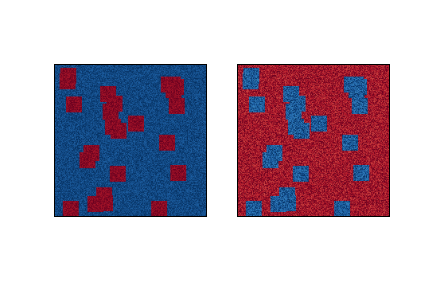
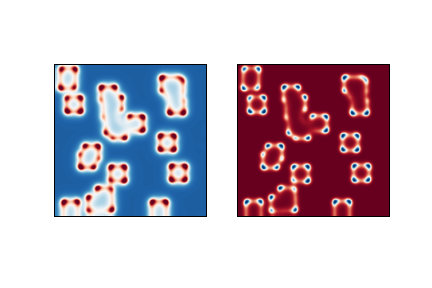
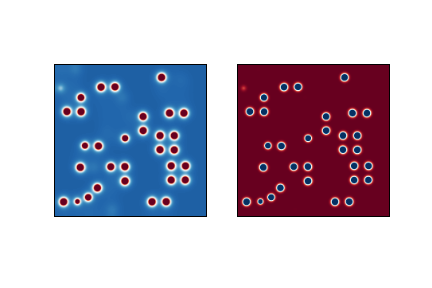
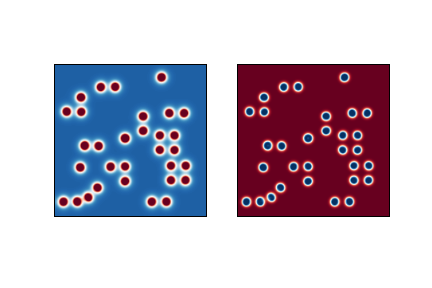
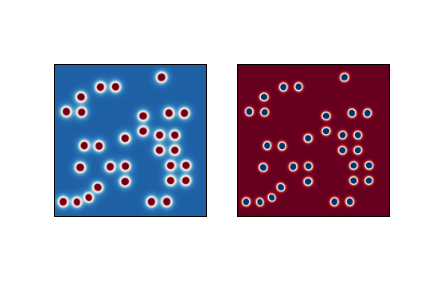
...
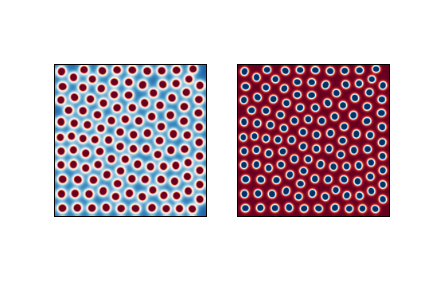
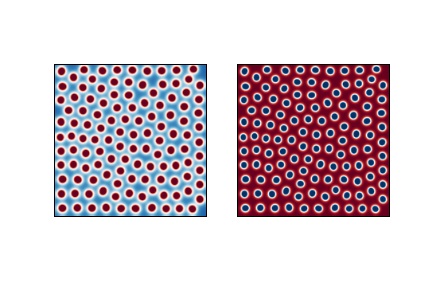
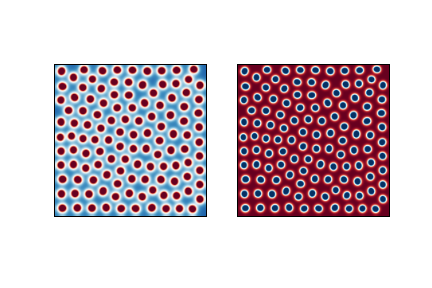
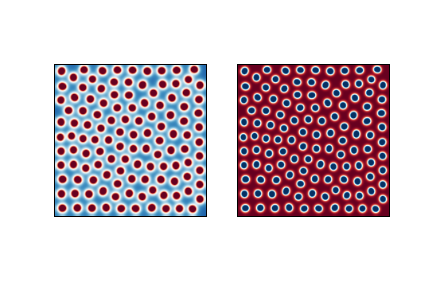
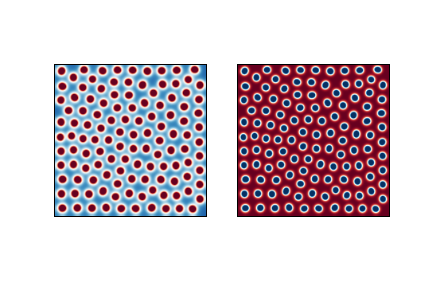

In [19]:
fig = plt.figure()

plt.subplot(1, 2, 1)
imgU = plt.imshow(back[0][0], cmap = cm.RdBu)
plt.xticks([]), plt.yticks([]);

plt.subplot(1, 2, 2)
imgV = plt.imshow(back[0][1], cmap = cm.RdBu)
plt.xticks([]), plt.yticks([]);

def animate(data):
    imgU.set_array(data[0])
    imgV.set_array(data[1])

anim.FuncAnimation(fig, animate, frames=back, interval=80)

## Conclusion

##### Source

(1) We used the following lectures https://github.com/numerical-mooc/numerical-mooc available under Creative Commons Attribution license CC-BY 4.0, (c)2014 L.A. Barba, C. Cooper, G.F. Forsyth, A. Krishnan.

---
###### The cell below loads the style of this notebook. 

In [20]:
# Execute this cell to load the notebook's style sheet, then ignore it
from IPython.core.display import HTML
css_file = '../../styles/numericalmoocstyle.css'
HTML(open(css_file, "r").read())